# Water Supply Inequalities in a Large Indian City
## Temporal Analysis


This code was used to investigate 102 supply pocket areas that was supplied by the 5 different SRs temporally which reported supply throughout 2022 and 2023 (February 2022 - April 2023) for City X. 

In [1]:
# Import 3rd party libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 600

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

In [2]:
#reading all the csv files
data1 = pd.read_csv('FileA.csv',header=[0], index_col=0)
data2 = pd.read_csv('FileB_part1.csv',header=[0], index_col=0)
data3 = pd.read_csv('FileB_part2.csv',header=[0], index_col=0)
data4 = pd.read_csv('FileB_part3.csv',header=[0], index_col=0)
data5 = pd.read_csv('FileC_part1.csv',header=[1], index_col=0)
data6 = pd.read_csv('FileC_part2.csv',header=[1], index_col=0)
data7 = pd.read_csv('FileC_part3.csv',header=[0], index_col=0)

#reading the Date columns in their D/M/Y formats for respective files that have date columns. Data for data 2, 5,6 could not be converted due to different dataformatting/inproper data reporting.
data1['PlanDate'] = pd.to_datetime(data1['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data1['StartDate'] = pd.to_datetime(data1['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data1['StopDate'] = pd.to_datetime(data1['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

data3['PlanDate'] = pd.to_datetime(data3['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data3['StartDate'] = pd.to_datetime(data3['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data3['StopDate'] = pd.to_datetime(data3['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

data4['PlanDate'] = pd.to_datetime(data4['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data4['StartDate'] = pd.to_datetime(data4['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data4['StopDate'] = pd.to_datetime(data4['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

data7['PlanDate'] = pd.to_datetime(data7['PlanDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data7['StartDate'] = pd.to_datetime(data7['StartDate'],format= '%d-%m-%Y',errors='coerce').dt.date
data7['StopDate'] = pd.to_datetime(data7['StopDate'],format= '%d-%m-%Y',errors='coerce').dt.date

#dropping random rows that contained random values in specific files.
data1 = data1.dropna()

#renaming the columns for the some datasets
data5=data5.rename(columns={"Pocket Name/ID": "Pocket", "Plan Time": "PlanTime","Plan Date": "PlanDate","Supply Hrs.":"PlanSupplyHrs","StartDate":"StartDate","Start Time":"StartTime","Stop Date":"StopDate","Stop Time": "StopTime","Supply Hrs..1":"SupplyHrs","Supply Order":"SupplyOrder"})
data6=data6.rename(columns={"Pocket Name/ID": "Pocket", "Plan Time": "PlanTime","Plan Date": "PlanDate","Supply Hrs.":"PlanSupplyHrs","StartDate":"StartDate","Start Time":"StartTime","Stop Date":"StopDate","Stop Time": "StopTime","Supply Hrs..1":"SupplyHrs","Supply Order":"SupplyOrder"})

#only using specific datasets due to: (i) overlapping data (ii) only using 2023 data for spatial analysis
data = pd.concat([data1, data2, data3, data4, data5, data6, data7])
data = data.reset_index(drop=True)

#removing dataset end values
data = data[data.StartDate != '2022-12-31T00:00:00.000Z']
data = data[data.StartDate != '2022-12-31']

#removing non-existent dates
data = data[data.StopDate != '29-02-2023']
data = data[data.StopDate != '31-04-2023']

#removing illogical values
data = data.replace("-", np.nan)
cols = ['Pocket', 'StartDate', 'StartTime', 'StopDate', 'StopTime']
rows_with_nan = data[data[cols].isnull().any(axis=1)]
data = data.dropna(subset=['Pocket', 'StartDate', 'StartTime', 'StopDate', 'StopTime'])

#seperating 24x7 dataset
data247 = data[data.StartDate == '24X7']

#seperating non 24x7 dataset
data = data[data.StartDate != '24X7']

#converting the dates to dateformats
data['PlanDate'] = pd.to_datetime(data['PlanDate'],infer_datetime_format=True).dt.date
data['PlanTime']=pd.to_datetime(data['PlanTime'].astype(str),infer_datetime_format=True).dt.time

data['StartDate'] = pd.to_datetime(data['StartDate'],infer_datetime_format=True).dt.date
data['StopDate'] = pd.to_datetime(data['StopDate'],infer_datetime_format=True).dt.date

data['StartTime']=pd.to_datetime(data['StartTime'].astype(str),infer_datetime_format=True).dt.time
data['StopTime']=pd.to_datetime(data['StopTime'].astype(str),infer_datetime_format=True).dt.time

import datetime as dt
data["StartTime_TS"] = data.apply(lambda row: dt.datetime.combine(row['StartDate'], row['StartTime']), axis=1)
data["StopTime_TS"] = data.apply(lambda row: dt.datetime.combine(row['StopDate'], row['StopTime']), axis=1)

#removing st or th in the supply order column
data['SupplyOrder'] = data['SupplyOrder'].str.replace('[a-zA-Z]', '')
data['SupplyOrder']  = data['SupplyOrder'].astype(int)

#calculating supply duration
data['SupplyDuration'] = data['StopTime_TS']-data['StartTime_TS']
data["SupplyDurationhr"] = data['SupplyDuration'].apply(lambda x: x.total_seconds() / 3600)


In [3]:
def duplicate_handling(data):
    data = data.replace(r'^\s*$', np.nan, regex=True)
    duplicates_mask = data.duplicated(subset=['Pocket','StartTime_TS', 'StopTime_TS'],keep=False)
    duplicates = data[data.duplicated(subset=['Pocket','StartTime_TS', 'StopTime_TS'],keep=False)]
    grouped = duplicates.groupby(['Pocket','StartTime_TS', 'StopTime_TS'])
    sorted_filled_df = pd.DataFrame()
    for group_name, group_data in grouped:
        sorted_group = group_data.sort_values('StopTime_TS').fillna(method='ffill')
        sorted_filled_df = pd.concat([sorted_filled_df, sorted_group], ignore_index=True)

    result_df = sorted_filled_df.drop_duplicates(subset=['Pocket','StartTime_TS', 'StopTime_TS'], keep='last')
    new_data = data[~duplicates_mask]
    data = pd.concat([new_data, result_df])
    return data

data = duplicate_handling(data)

In [4]:
#Calculating Reporting Period
df_sorted = data.sort_values(by=['SR Name', 'StartTime_TS'])
result1 = df_sorted.groupby('SR Name').agg({'StartTime_TS': 'first'}).reset_index()
result2 = df_sorted.groupby('SR Name').agg({'StartTime_TS': 'last'}).reset_index()
result = pd.merge(result1, result2, on='SR Name')

result['StartTime_TS_x'] = result['StartTime_TS_x'].apply(lambda x: x.replace(hour=0, minute=0, second=0, microsecond=0))
result['StartTime_TS_y'] = result['StartTime_TS_y'].apply(lambda x: x.replace(hour=0, minute=0, second=0, microsecond=0))
result['SupplyDuration'] = (result['StartTime_TS_y']-result['StartTime_TS_x']).dt.days
result["SupplyDurationday"] = (result['SupplyDuration']+1)

#Calculating Number of Schedules
count_df = data.groupby('SR Name')['StartTime_TS'].nunique().reset_index()
count_df.rename(columns={'StartTime_TS': 'Freq'}, inplace=True)

#Merging all the computed dataframes
merged_df = pd.merge(result, count_df, on='SR Name')

In [5]:
# For temporal analysis, we only analyze these Service Reservoirs that have reporting periods for 15 months
values_to_filter = merged_df.loc[merged_df['SupplyDurationday'] > 455, 'SR Name'].tolist()
data = data[data['SR Name'].isin(values_to_filter)]

In [6]:
#To address High Planned Supply Hours, all Plan Supply Hours values greater than 48 hours were divided by 24
data['PlanSupplyHrs'] = np.where(data['PlanSupplyHrs'] > 48, data['PlanSupplyHrs'] / 24, data['PlanSupplyHrs'])
data['SupplyHrs'] = np.where(data['SupplyHrs'] > 48, data['SupplyHrs'] / 24, data['SupplyHrs'])


In [7]:
#Investigating  -ve values and recitified if an error was found using the Supply Hours column
errors = data[data['SupplyDurationhr'] <= 0]  #changing and investigating into -ve values and recitified if an error using the supply hours column
data = data[~(data['SupplyDurationhr'] <= 0)]  

errors = errors.dropna(subset=['SupplyHrs'])
errors['StopTime_TS'] =  errors['StartTime_TS'] + pd.to_timedelta(errors.SupplyHrs, unit='h')
errors = errors[errors['SupplyHrs'] <= 48]
errors['StopDate'] = errors['StopTime_TS'].dt.date
errors['StopTime'] = errors['StopTime_TS'].dt.time

errors['SupplyDuration'] = errors['StopTime_TS']-errors['StartTime_TS']
errors["SupplyDurationhr"] = errors['SupplyDuration'].apply(lambda x: x.total_seconds() / 3600)

In [8]:
data = pd.concat([data, errors])
data = data.reset_index(drop=True)
data = data.drop([5337, 7443,5294,5356,1207,4598])#rows with illogical values and duplicate entries.
df_sorted = data.sort_values(by=['Pocket', 'StartTime_TS'])


In [9]:
#shifting new column for temporal analysis
df_sorted['StartTime_TS_next'] = df_sorted['StartTime_TS']
df_sorted['StopTime_TS_next'] = df_sorted['StopTime_TS']
columns_to_shift = ['StartTime_TS_next', 'StopTime_TS_next']
df_sorted[columns_to_shift] = df_sorted.groupby('Pocket')[columns_to_shift].shift(-1)

In [10]:
df_edited = df_sorted[['SR Name', 'Pocket', 'StartTime_TS', 'StopTime_TS', 'StartTime_TS_next','StopTime_TS_next']]
df_edited = df_edited.dropna()

# Calculating Supply Duration
df_edited['SD'] = df_edited['StopTime_TS']-df_edited['StartTime_TS']
df_edited["SD"] = df_edited['SD'].apply(lambda x: x.total_seconds() / 3600)
df_edited = df_edited[df_edited['SD'] <= 48]#making sure no schedules more than 48 hours is present despite datacleaning

# Calculating Supply Frequency
df_edited['SF'] = df_edited['StartTime_TS_next']-df_edited['StartTime_TS']
df_edited['SFdiff'] = df_edited['StartTime_TS_next']-df_edited['StartTime_TS']
df_edited["SFdiff"] = df_edited['SFdiff'].apply(lambda x: x.total_seconds() )

# Calculating Supply Continuity
df_edited["SF"] = df_edited['SF'].apply(lambda x: x.total_seconds() / 86400)
df_edited["SF_1"] = 1/df_edited["SF"]

# Calculating Supply Continuity
df_edited["SC"] = df_edited['SF_1']*df_edited['SD']

In [11]:
#Checking if the pockets are across 2022 and 2023
df_2022 = df_edited[df_edited['StartTime_TS'].dt.year == 2022]
df_2023 = df_edited[df_edited['StartTime_TS'].dt.year == 2023]
unique_values_2022 = set(df_2022['Pocket'])
unique_values_2023 = set(df_2023['Pocket'])
common_values = unique_values_2022.intersection(unique_values_2023)
common_values_list = list(common_values)

df_edited1 = df_edited.copy()
df_edited = df_edited[df_edited['Pocket'].isin(common_values_list)]

start_date = pd.to_datetime('2022-01-01')
end_date = pd.to_datetime('2023-04-20')
df_edited = df_edited[(df_edited['StartTime_TS'] >= start_date) & (df_edited['StopTime_TS'] <= end_date)]

In [12]:
#Checking if the pockets are across 2022 and 2023
df_2022 = df_edited[df_edited['StartTime_TS'].dt.year == 2022]
df_2023 = df_edited[df_edited['StartTime_TS'].dt.year == 2023]
unique_values_2022 = set(df_2022['Pocket'])
unique_values_2023 = set(df_2023['Pocket'])
common_values = unique_values_2022.intersection(unique_values_2023)
common_values_list = list(common_values)

df_edited1 = df_edited.copy()
df_edited = df_edited[df_edited['Pocket'].isin(common_values_list)]

start_date = pd.to_datetime('2022-01-01')
end_date = pd.to_datetime('2023-04-20')#Looking until Mid April to ensure the pockets we analyze go beyond April
df_edited = df_edited[(df_edited['StartTime_TS'] >= start_date) & (df_edited['StopTime_TS'] <= end_date)]
df_april_2023 = df_edited[df_edited['StartTime_TS'].dt.strftime('%Y-%m') == '2023-04']#removing pockets which do not report all throughout the time period especially towards the end
unique_values = df_april_2023['Pocket'].unique()
df_edited = df_edited[df_edited['Pocket'].isin(unique_values)]



In [13]:
#Daily Supply Pocket area SC, SD,SF average.
daily_group_avg = df_edited.groupby(['StartTime_TS', 'Pocket'])['SC', 'SD', 'SF'].mean().reset_index()
daily_group_dayavg = daily_group_avg.copy()
daily_group_dayavg['Start_Date'] = daily_group_dayavg['StartTime_TS'].dt.date
daily_group_dayavg = daily_group_dayavg.groupby(['Start_Date', 'Pocket']).mean()
daily_group_dayavg = daily_group_dayavg.reset_index()
daily_group_dayavg.rename(columns={'Start_Date': 'Date'}, inplace=True)
daily_group_dayavg['Date'] = pd.to_datetime(daily_group_dayavg['Date'])

date_count = daily_group_dayavg.groupby('Date').agg('size').reset_index()
date_count = date_count.rename(columns={0:'Freq'})
date_count['PercentSupply'] = (date_count['Freq']/(df_edited['Pocket'].nunique()))*100

In [14]:
df_sorted = df_edited.sort_values(by=['Pocket', 'StartTime_TS'])
result1 = df_sorted.groupby('Pocket').agg({'StartTime_TS': 'first'}).reset_index()
result2 = df_sorted.groupby('Pocket').agg({'StartTime_TS': 'last'}).reset_index()
result = pd.merge(result1, result2, on='Pocket')

In [15]:
#restricting schedules within the timeperiod
start_date = pd.to_datetime('2022-01-12')
end_date = pd.to_datetime('2023-04-20')#Looking until Mid April to ensure the pockets we analyze go beyond April
df_edited = df_edited[(df_edited['StartTime_TS'] >= start_date) & (df_edited['StopTime_TS'] <= end_date)]

#temp DataFrame to create Daily Dates
dates = pd.date_range(start='2022-01-12', end='2023-04-20', freq='D')#Calculating until Mid April to ensure temporal continuity. 
df = pd.DataFrame([(date, value) for date in dates for value in unique_values], columns=['Date', 'Pocket'])

merged_df = pd.merge(df, daily_group_dayavg, on=['Date', 'Pocket'], how='left')
merged_df['SC'] = merged_df.groupby('Pocket')['SC'].fillna(method='ffill')
merged_df['SD'] = merged_df.groupby('Pocket')['SD'].fillna(method='ffill')
merged_df['SF'] = merged_df.groupby('Pocket')['SF'].fillna(method='ffill')

merged_df['SC'] = merged_df['SC'].fillna(0)
merged_df['SD'] = merged_df['SD'].fillna(0)
merged_df['SF'] = merged_df['SF'].fillna(0)

merged_df_mean = merged_df.groupby(['Date', 'Pocket'])['SC', 'SD', 'SF'].mean().reset_index()


In [16]:
#Ordinal Dates for plotting
merged_df_mean['Date_num'] = merged_df_mean['Date'].apply(lambda x: x.toordinal())
first_of_month_dates = merged_df_mean[merged_df_mean['Date'].dt.is_month_start]['Date']

#Mean Across the Supply Pocket areas
merged_df_meanline = merged_df_mean.groupby(['Date'])[['SC', 'SD', 'SF']].mean().reset_index()
merged_df_meanline['Date_num'] = merged_df_meanline['Date'].apply(lambda x: x.toordinal())

#Supply Frequency
merged_df_mean['SF_1'] = (1/merged_df_mean['SF'])*30
merged_df_meanline['SF_1'] = (1/merged_df_meanline['SF'])*30

In [17]:
tick_size = 10
plt.rcParams.update({
    'lines.linewidth': 4,
    'axes.labelsize': 18,
    'axes.titlesize': 18,
    'xtick.major.size': tick_size,
    'xtick.minor.size': tick_size,
    'ytick.major.size': tick_size,
    'ytick.minor.size': tick_size,
    'ytick.major.width': 2,
    'ytick.minor.width': 2,
    'xtick.minor.width': 2,
    'xtick.major.width': 2
})

In [18]:
rc = {'lines.linewidth': 4,
      'axes.labelsize': 18, 
      'axes.titlesize': 18}
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 2

#Figure for Temporal Variation between Supply Pocket Areas
fig, axes = plt.subplots(3, 1, figsize=(15, 18))

#Subplot1
sns.lineplot(data=merged_df_mean, x=merged_df_mean['Date_num'], y='SC', hue='Pocket',linewidth=1, ax=axes[0], palette=['grey'])
sns.lineplot(data=merged_df_meanline, x=merged_df_meanline['Date_num'], y='SC',linewidth=4, ax=axes[0], color='darkorange')
axes[0].grid(False)
axes[0].legend().set_visible(False)
axes[0].set_xlim(738187, 738610) #Ordinal dates for Feb 2022 to April 2023
axes[0].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[0].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)
axes[0].set_ylim(0, 5)
axes[0].set_xlabel(' ')
axes[0].set_ylabel('Supply Continuity(hours/day)')

#Subplot2
sns.lineplot(data=merged_df_mean, x='Date_num', y='SD', hue='Pocket', linewidth=1,  ax=axes[1], palette=['grey'])
sns.lineplot(data=merged_df_meanline, x='Date_num', y='SD',linewidth=4, ax=axes[1], color='darkorange')
axes[1].grid(False)
axes[1].legend().set_visible(False)
axes[1].set_xlabel(' ')
axes[1].set_ylabel('Supply Duration(hours/supply)')
axes[1].set_xlim(738187, 738610) #Ordinal dates for Feb 2022 to April 2023
axes[1].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[1].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)

#Subplot3
sns.lineplot(data=merged_df_mean, x='Date_num', y='SF_1', hue='Pocket', linewidth=1, ax=axes[2], palette=['grey'])
sns.lineplot(data=merged_df_meanline, x='Date_num', y='SF_1',linewidth=4, ax=axes[2], color='darkorange')
axes[2].grid(False)
axes[2].legend().set_visible(False)
axes[2].set_xlabel(' ')
axes[2].set_ylabel('Supply Frequency (supplies/month)')
axes[2].set_xlim(738187, 738610)  #Ordinal dates for Feb 2022 to April 2023
axes[2].set_ylim(0, 12)  
axes[2].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[2].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)

plt.tight_layout()  
plt.show()
fig.savefig('transparent_plot.png', transparent=True)


In [19]:
#Analyzing Supply Pocket Areas into 5 quintiles
merged_df_meanpoc = merged_df_mean.groupby(['Pocket'])[['SC', 'SD', 'SF']].mean().reset_index()
merged_df_meanpoc_sort = merged_df_meanpoc.sort_values(by='SC', ascending=False)

group_size = len(merged_df_meanpoc_sort) // 5

# Splitting to five groups
group_1 = merged_df_meanpoc_sort.iloc[:group_size]
group_2 = merged_df_meanpoc_sort.iloc[group_size:2*group_size]
group_3 = merged_df_meanpoc_sort.iloc[2*group_size:3*group_size]
group_4 = merged_df_meanpoc_sort.iloc[3*group_size:4*group_size]
group_5 = merged_df_meanpoc_sort.iloc[4*group_size:]

# Last group
if len(merged_df_meanpoc_sort) % 5 != 0:
    group_5 = merged_df_meanpoc_sort.iloc[4*group_size:]

# Converting them to lists
group_1_list = group_1['Pocket'].tolist()
group_2_list = group_2['Pocket'].tolist()
group_3_list = group_3['Pocket'].tolist()
group_4_list = group_4['Pocket'].tolist()
group_5_list = group_5['Pocket'].tolist()

# Mean of each group
group_1_mean = group_1.mean()
group_2_mean = group_2.mean()
group_3_mean = group_3.mean()
group_4_mean = group_4.mean()
group_5_mean = group_5.mean()

group_1_mean = merged_df_mean[merged_df_mean['Pocket'].isin(group_1_list)]
group_2_mean = merged_df_mean[merged_df_mean['Pocket'].isin(group_2_list)]
group_3_mean = merged_df_mean[merged_df_mean['Pocket'].isin(group_3_list)]
group_4_mean = merged_df_mean[merged_df_mean['Pocket'].isin(group_4_list)]
group_5_mean = merged_df_mean[merged_df_mean['Pocket'].isin(group_5_list)]


In [20]:
#Plotting the Figure for 5 quintiles
fig, axes = plt.subplots(3, 1, figsize=(15, 18))

#First subplot
sns.lineplot(data=group_1_mean, x='Date_num', y='SC',linewidth=3, ax=axes[0], label='Top Quintile',color='blue',ci=None)
sns.lineplot(data=group_2_mean, x='Date_num', y='SC',linewidth=3, ax=axes[0], label='2nd Quintile',color='red',ci=None)
sns.lineplot(data=group_3_mean, x='Date_num', y='SC',linewidth=3, ax=axes[0], label='3rd Quintile',color='green',ci=None)
sns.lineplot(data=group_4_mean, x='Date_num', y='SC',linewidth=3, ax=axes[0], label='4th Quintile',color='yellow',ci=None)
sns.lineplot(data=group_5_mean, x='Date_num', y='SC',linewidth=3, ax=axes[0], label='Bottom Quintile',color='black',ci=None)

axes[0].grid(False)
axes[0].set_xlim(738187, 738610) #Ordinal dates for Feb 2022 to April 2023
axes[0].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[0].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)
axes[0].legend(title='Supply Pocket Area')
axes[0].set_ylim(0, 3.5)
axes[0].set_xlabel(' ')
axes[0].set_ylabel('Supply Continuity(hours/day)')

#Second subplot
sns.lineplot(data=group_1_mean, x='Date_num', y='SD',linewidth=3, ax=axes[1], color='blue',ci=None)
sns.lineplot(data=group_2_mean, x='Date_num', y='SD',linewidth=3, ax=axes[1], color='red',ci=None)
sns.lineplot(data=group_3_mean, x='Date_num', y='SD',linewidth=3, ax=axes[1], color='green',ci=None)
sns.lineplot(data=group_4_mean, x='Date_num', y='SD',linewidth=3, ax=axes[1], color='yellow',ci=None)
sns.lineplot(data=group_5_mean, x='Date_num', y='SD',linewidth=3, ax=axes[1], color='black',ci=None)

axes[1].grid(False)
axes[1].legend().set_visible(False)
axes[1].set_xlim(738187, 738610) #Ordinal dates for Feb 2022 to April 2023
axes[1].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[1].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)
axes[1].set_xlabel(' ')
axes[1].set_ylabel('Supply Duration(hours/supply)')
axes[1].set_ylim(6, 16)

#Third subplot
sns.lineplot(data=group_1_mean, x='Date_num', y='SF_1',linewidth=3, ax=axes[2], color='blue',ci=None)
sns.lineplot(data=group_2_mean, x='Date_num', y='SF_1',linewidth=3, ax=axes[2], color='red',ci=None)
sns.lineplot(data=group_3_mean, x='Date_num', y='SF_1',linewidth=3, ax=axes[2], color='green',ci=None)
sns.lineplot(data=group_4_mean, x='Date_num', y='SF_1',linewidth=3, ax=axes[2], color='yellow',ci=None)
sns.lineplot(data=group_5_mean, x='Date_num', y='SF_1',linewidth=3, ax=axes[2], color='black',ci=None)

axes[2].grid(False)
axes[2].legend().set_visible(False)
axes[2].set_xlim(738187, 738610) #Ordinal dates for Feb 2022 to April 2023
axes[2].set_ylim(2, 6) 
axes[2].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[2].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)
axes[2].set_xlabel(' ')
axes[2].set_ylabel('Supply Frequency(supply/month)')

plt.tight_layout() 
plt.show()
fig.savefig('transparent_plot.png', transparent=True)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [21]:
start_date = '2022-02-01'
end_date = '2023-04-01'

# Filtering All Groups for Feb 2022 to April 2023 to ensure slope calculations are accurate
mask = (merged_df_meanline['Date'] >= start_date) & (merged_df_meanline['Date'] <= end_date)
filtered_df = merged_df_meanline.loc[mask]
filtered_df = filtered_df.reset_index(drop=True)

# Filtering Group 1 for Feb 2022 to April 2023 to ensure slope calculations are accurate
mask = (group_1_mean['Date'] >= start_date) & (group_1_mean['Date'] <= end_date)
filtered_group1 = group_1_mean.loc[mask]
filtered_group1 = filtered_group1.reset_index(drop=True)

# Filtering Group 5 for Feb 2022 to April 2023 to ensure slope calculations are accurate
mask = (group_5_mean['Date'] >= start_date) & (group_5_mean['Date'] <= end_date)
filtered_group5 = group_5_mean.loc[mask]
filtered_group5 = filtered_group5.reset_index(drop=True)


In [22]:
#PLotting Figure comparing supply metrics between best and worst performing supply pockets 
fig, axes = plt.subplots(3, 1, figsize=(15, 18))

group_1_mean['Date_num'] = group_1_mean['Date'].apply(lambda x: x.toordinal())
merged_df_mean['Date_num'] = merged_df_mean['Date'].apply(lambda x: x.toordinal())
group_5_mean['Date_num'] = group_5_mean['Date'].apply(lambda x: x.toordinal())
first_of_month_dates = merged_df_mean[merged_df_mean['Date'].dt.is_month_start]['Date']

# First subplot
sns.regplot(data=filtered_group1, x='Date_num', y='SC', scatter=False, ax=axes[0],  color='blue',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.regplot(data=filtered_df, x='Date_num', y='SC', scatter=False, ax=axes[0],  color='darkorange',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.regplot(data=filtered_group5, x='Date_num', y='SC', scatter=False, ax=axes[0],  color='black',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.lineplot(data=filtered_group1, x='Date_num', y='SC',linewidth=4, ax=axes[0], color='blue',ci=None, label='Avg. of Top Quintile Areas')
sns.lineplot(data=filtered_df, x='Date_num', y='SC',linewidth=4, ax=axes[0], color='darkorange',ci=None, label='Avg. of all Areas')
sns.lineplot(data=filtered_group5, x='Date_num', y='SC',linewidth=4, ax=axes[0], color='black',ci=None, label='Avg. of Bottom Quintile Areas')

axes[0].grid(False)
axes[0].set_xlim(738187, 738610) #Ordinal dates for Feb 2022 to April 2023
axes[0].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[0].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)
axes[0].set_ylim(0, 5)
axes[0].set_xlabel(' ')
axes[0].set_ylabel('Supply Continuity(hours/day)')

#second subplot
sns.regplot(data=filtered_group1, x='Date_num', y='SD', scatter=False, ax=axes[1], color='blue',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.regplot(data=filtered_df, x='Date_num', y='SD', scatter=False, ax=axes[1], color='darkorange',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.regplot(data=filtered_group5, x='Date_num', y='SD', scatter=False, ax=axes[1], color='black',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.lineplot(data=filtered_group1, x='Date_num', y='SD',linewidth=4, ax=axes[1], color='blue',ci=None)
sns.lineplot(data=filtered_df, x='Date_num', y='SD',linewidth=4, ax=axes[1], color='darkorange',ci=None)
sns.lineplot(data=filtered_group5, x='Date_num', y='SD',linewidth=4, ax=axes[1], color='black',ci=None)

axes[1].grid(False)
axes[1].legend().set_visible(False)
axes[1].set_xlabel(' ')
axes[1].set_ylabel('Supply Duration(hours/supply)')
axes[1].set_xlim(738187, 738610)#Ordinal dates for Feb 2022 to April 2023
axes[1].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[1].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)
axes[1].set_ylim(6, 16)

# Third subplot
sns.regplot(data=filtered_group1, x='Date_num', y='SF_1', scatter=False,ax=axes[2],  color='blue',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.regplot(data=filtered_df, x='Date_num', y='SF_1', scatter=False, ax=axes[2], color='darkorange',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.regplot(data=filtered_group5, x='Date_num', y='SF_1', scatter=False,ax=axes[2],  color='black',ci=None, line_kws={"linewidth": 1, "linestyle": "--"})
sns.lineplot(data=filtered_group1, x='Date_num', y='SF_1',linewidth=4, ax=axes[2], color='blue',ci=None)
sns.lineplot(data=filtered_df, x='Date_num', y='SF_1',linewidth=4, ax=axes[2], color='darkorange',ci=None)
sns.lineplot(data=filtered_group5, x='Date_num', y='SF_1',linewidth=4, ax=axes[2], color='black',ci=None)

axes[2].set_xlim(738187, 738610)  #Ordinal dates for Feb 2022 to April 2023
axes[2].set_xticks(first_of_month_dates.map(lambda date: date.toordinal()))
axes[2].set_xticklabels(first_of_month_dates.dt.strftime('%Y-%m-%d'), rotation=45)
axes[2].grid(False)
axes[2].legend().set_visible(False)
axes[2].set_xlabel(' ')
axes[2].set_ylabel('Supply Frequency(supply/month)')
axes[2].set_ylim(2, 6)

plt.tight_layout() 
plt.show()
fig.savefig('transparent_plot.png', transparent=True)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [23]:
#Creating a new copy of DataFrame for Avg vs Slope Analysis for each Supply Pocket Area
merged_df_mean_copy = merged_df_mean.copy()
start_date = '2022-02-01'
end_date = '2023-04-01'
filtered_df_slope = merged_df_mean_copy[(merged_df_mean_copy['Date'] >= start_date) & (merged_df_mean_copy['Date'] <= end_date)].reset_index(drop=True)

In [24]:
import statsmodels.api as sm

#Slope Calculation for SC
def calculate_slope(Pocket):
    index_date_1 = Pocket[Pocket['Date_num'] == 738187].index[0]
    # Intial Value
    initial_y = Pocket.loc[index_date_1, 'SC']
    #Intercept
    X = sm.add_constant(Pocket['Date_num'])  
    y = Pocket['SC']
    model = sm.OLS(y, X).fit()
    #Slope Coefficient
    slope = model.params[1]  
    return pd.Series({ 'initial_y': initial_y, 'slope': slope})

slopes = pd.DataFrame()
slopes = filtered_df_slope.groupby('Pocket').apply(calculate_slope)

#Monthly Change
slopes['monthly_change'] = slopes['slope'] * 30

# %Change per month
slopes['percentage_change_per_month'] = (slopes['monthly_change'] / slopes['initial_y']) * 100
slopes = pd.DataFrame(slopes).reset_index()


In [25]:
#data exported from spatial analysis contain average SC,SD and SF for each supply pocket area
avgpoc = pd.read_csv('avgpocket.csv',header=[0], index_col=0) 
result = pd.merge(slopes, merged_df_meanpoc_sort, on='Pocket')


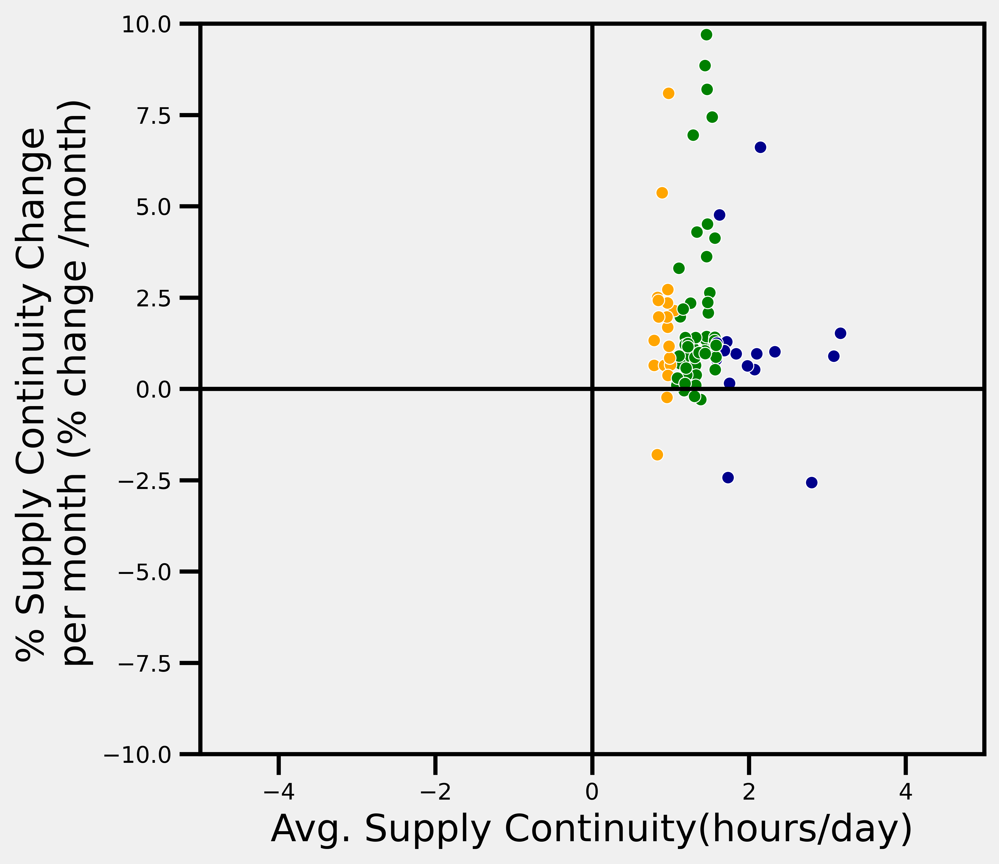

In [26]:
#Assigning Color Changes
result['Color'] = result['Pocket'].apply(lambda x: 'darkblue' if x in group_1_list else ('orange' if x in group_5_list else 'green'))

#Plotting Figure for Avg Supply Continuity vs % Supply Continuity Change per month for all Supply Pocket areas
fig, ax = plt.subplots(figsize=(6,6)) 
ax = sns.scatterplot(x=result['SC'], y=result['percentage_change_per_month'], color=result['Color'])

#Drawing Mid lines
x_mid = 0
y_mid = 0  
ax.axvline(x=x_mid, color='black', linestyle='-', linewidth=2) 
ax.axhline(y=y_mid, color='black', linestyle='-', linewidth=2) 

plt.grid(False)
plt.xlabel('Avg. Supply Continuity(hours/day)')
plt.ylabel('% Supply Continuity Change \n per month (% change /month)')
plt.xlim(-5,5)
plt.ylim(-10,10)
plt.grid(False)
plt.show()


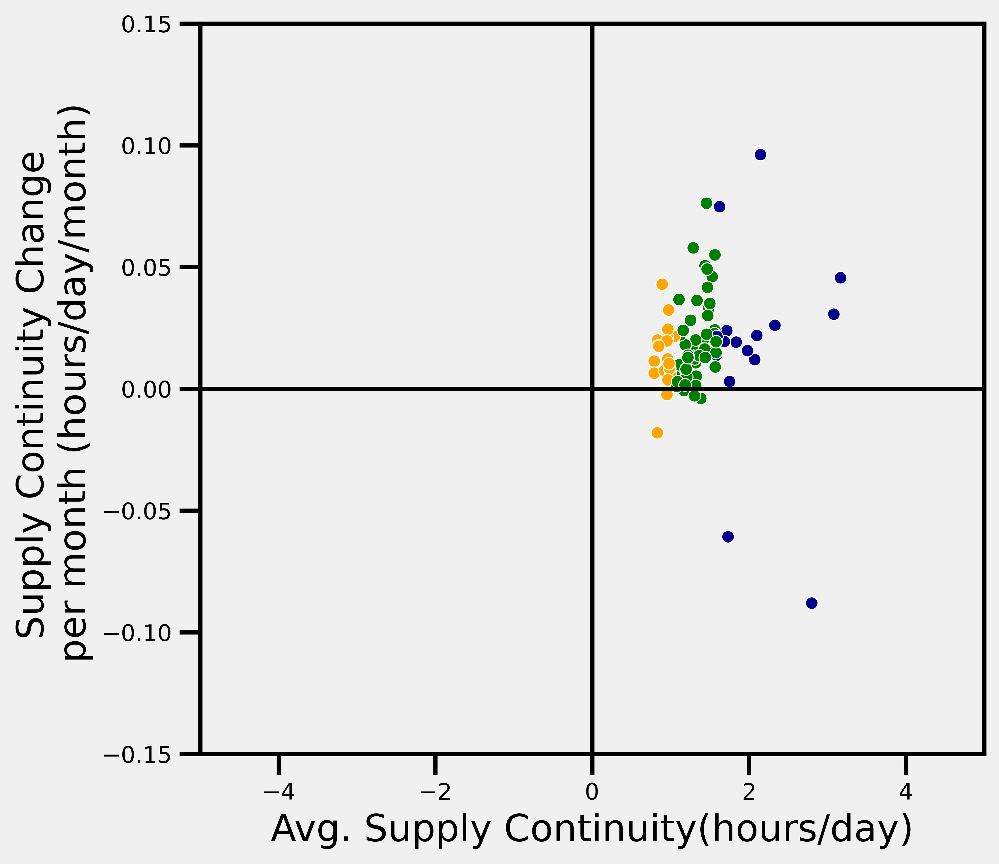

In [27]:
#Plotting Figure for Avg Supply Continuity vs Abs Supply Continuity Change per month for all Supply Pocket areas
fig, ax = plt.subplots(figsize=(6,6)) 

ax = sns.scatterplot(x=result['SC'], y=result['monthly_change'], color=result['Color'])

#Drawing Midlines
x_mid = 0  
y_mid = 0  
ax.axvline(x=x_mid, color='black', linestyle='-', linewidth=2)  
ax.axhline(y=y_mid, color='black', linestyle='-', linewidth=2) 

plt.grid(False)
plt.xlabel('Avg. Supply Continuity(hours/day)')
plt.ylabel('Supply Continuity Change \n per month (hours/day/month)')
plt.xlim(-5,5)
plt.ylim(-0.15,0.15)
plt.grid(False)
plt.show()

In [28]:
#Slope Calculation for SF
def calculate_slope(Pocket):
    index_date_1 = Pocket[Pocket['Date_num'] == 738187].index[0]
    #Intial Value
    initial_y = Pocket.loc[index_date_1, 'SF_1']
    #Intercept
    X = sm.add_constant(Pocket['Date_num'])  
    y = Pocket['SF_1']
    model = sm.OLS(y, X).fit()
    # Slope coefficient
    slope = model.params[1]  
    return pd.Series({ 'initial_y': initial_y, 'slope': slope})

slopes1 = pd.DataFrame()
slopes1 = filtered_df_slope.groupby('Pocket').apply(calculate_slope)

#Monthly change
slopes1['monthly_change'] = slopes1['slope'] * 30

#% change per month
slopes1['percentage_change_per_month'] = (slopes1['monthly_change'] / slopes1['initial_y']) * 100

In [29]:
#Merging the dataframes and calculating Supply Frequency on per month basis
result1 = pd.merge(slopes1, merged_df_meanpoc_sort, on='Pocket')
result1['SF_1'] = (1/result1['SF'])*30

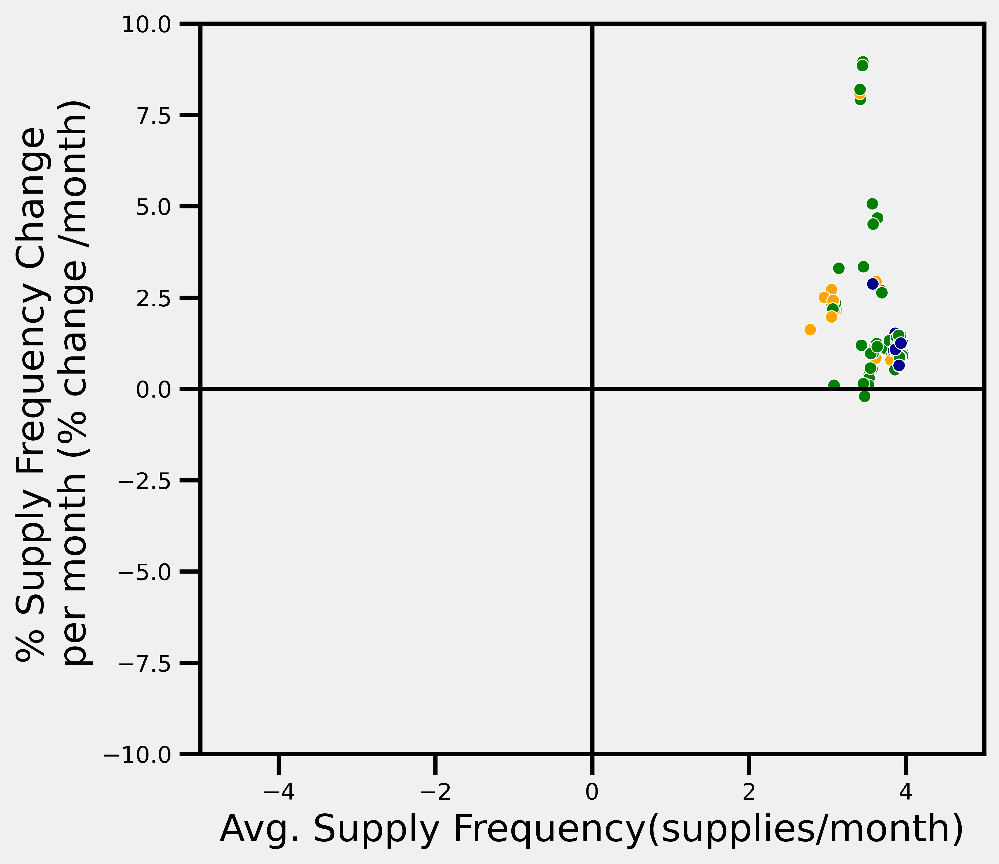

In [30]:
#Color Change
result1['Color'] = result1['Pocket'].apply(lambda x: 'darkblue' if x in group_1_list else ('orange' if x in group_5_list else 'green'))

#Plotting Figure Showing avg. Supply Frequency vs Supply Frequency Change per month for all supply pocket areas
fig, ax = plt.subplots(figsize=(6,6)) 
ax = sns.scatterplot(x=result1['SF_1'], y=result1['percentage_change_per_month'],color=result['Color'])

#Drawing Mid lines
x_mid = 0 
y_mid = 0 
ax.axvline(x=x_mid, color='black', linestyle='-', linewidth=2)
ax.axhline(y=y_mid, color='black', linestyle='-', linewidth=2) 

plt.grid(False)
plt.xlabel('Avg. Supply Frequency(supplies/month)')
plt.ylabel('% Supply Frequency Change \n per month (% change /month)')
plt.xlim(-5,5)
plt.ylim(-10,10)
plt.grid(False)
plt.show()

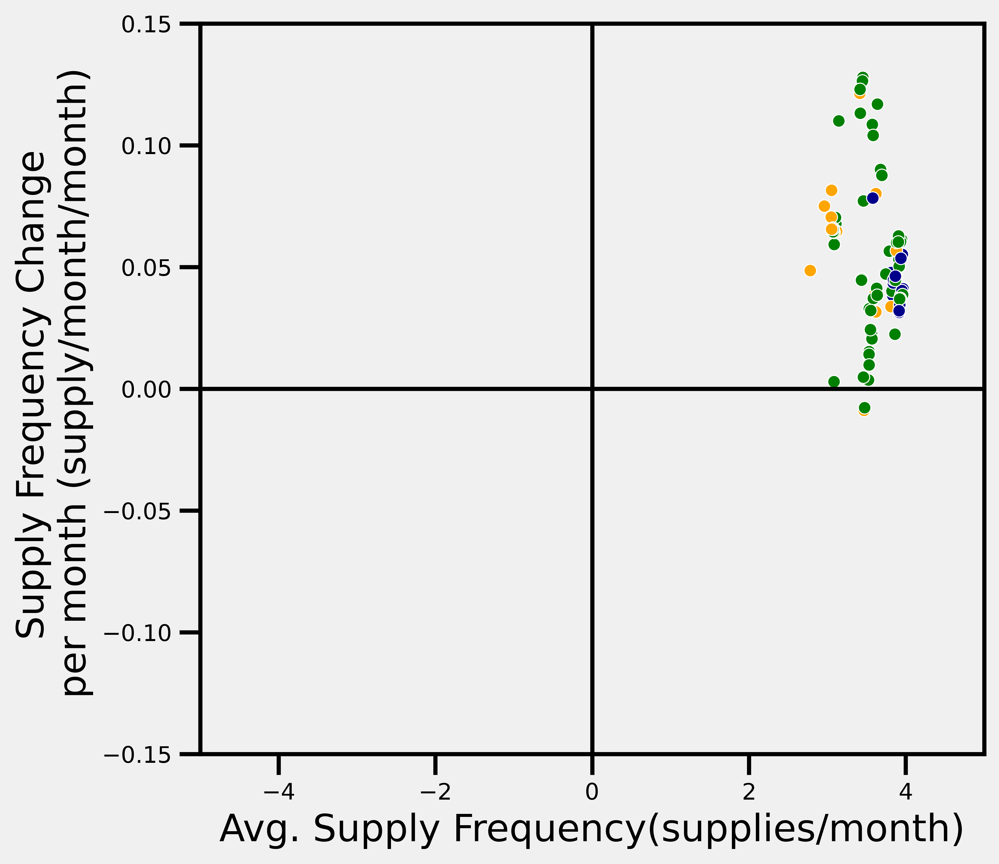

In [31]:
#Plotting Figure Showing avg. Supply Frequency vs Abs Supply Frequency Change per month for all supply pocket areas
fig, ax = plt.subplots(figsize=(6,6)) 
ax = sns.scatterplot(x=result1['SF_1'], y=result1['monthly_change'],color=result['Color'])

#Drawing Mid Lines
x_mid = 0 
y_mid = 0  
ax.axvline(x=x_mid, color='black', linestyle='-', linewidth=2)
ax.axhline(y=y_mid, color='black', linestyle='-', linewidth=2) 

plt.grid(False)
plt.xlabel('Avg. Supply Frequency(supplies/month)')
plt.ylabel('Supply Frequency Change \n per month (supply/month/month)')
plt.xlim(-5,5)
plt.ylim(-0.15,0.15)
plt.grid(False)
plt.show()

In [32]:
grouped_df_others = avgpoc[~avgpoc['Pocket'].isin(unique_values)]#331 supply pocket areas
grouped_df = merged_df.groupby(['Pocket'])[['SC', 'SD', 'SF']].mean().reset_index()#102 supply pocket areas


In [33]:
from scipy.stats import ttest_ind

p_value = ttest_ind(grouped_df_others['AvgCont'], grouped_df['SC'])

mean_difference = abs(grouped_df_others['AvgCont'].mean() - grouped_df['SC'].mean())
print("Mean Difference:", mean_difference)

pooled_std = np.sqrt((grouped_df_others['AvgCont'].std()**2 + grouped_df['SC'].std()**2) / 2)
cohen_d = mean_difference / pooled_std
print("Cohen's d:", cohen_d)

p_value

Mean Difference: 0.24852882828360823
Cohen's d: 0.5184737192265182


TtestResult(statistic=-4.341961879736373, pvalue=1.7620220553815117e-05, df=431.0)